In [1]:
# Celda 1: Imports, semilla y configuración de hilos

import numpy as np                      # Celdas: 2,3,4,5,6,7,8 (NP arrays, random choice with rng)
import matplotlib.pyplot as plt         # Celdas: 2,6,7,8 (Visualización, gráficos, animación)
import time                             # Celda: 5 (Medición de tiempos)
from tqdm import tqdm                   # Celda: 5 (Barra de progreso, opcional)
import argparse                         # Celdas: 1 (parseo de argumentos)
import sys                              # Para obtener argv en parse_known_args
from numba import njit, set_num_threads, get_num_threads, prange
import os                               # Para obtener el número de hilos disponibles
import h5py  # Para guardar resultados en formato HDF5
import subprocess, threading, re, math # Última celda para la generación del video

np.set_printoptions(threshold=np.inf, linewidth=200)

# ─── Configuración de semilla para reproducibilidad ──────────────────────────
seed = None                             # None = usar entropía del sistema
rng  = np.random.default_rng(seed)      # PCG64 RNG: seguro y adecuado para simulaciones

def establecer_numero_hilos(threads_percentage):
    #Establecemos el número de hilos a usar asegurándonos de que no exceda el número de hilos disponibles ni sea menor a 1
    n_threads_available = os.cpu_count()
    if n_threads_available is None:
        n_threads_available = 1  # Si no se puede determinar, usar al menos 1 hilo
    threads_percentage = max(1, min(100, threads_percentage))
    set_num_threads(int(n_threads_available*(threads_percentage / 100.0)))
    n_threads = get_num_threads()
    print(f"Usando {n_threads} hilos de {n_threads_available} disponibles ({threads_percentage}%).")


In [11]:
# Celda 2: Observables

def single_energy(config, J):
    """
    Calcula la energía total del modelo de Ising 2D con contorno periódico.
    """
    # Enlaces derecha e inferior para contar cada par una sola vez
    right = np.roll(config, -1, axis=1)
    down  = np.roll(config, -1, axis=0)
    energy = -J * np.sum(config * (right + down))
    return energy


def new_energy(J, frames:np.ndarray) -> np.ndarray:
    """
    Calcula la energía total del modelo de Ising 2D con contorno periódico.
    """
    # Enlaces derecha e inferior para contar cada par una sola vez
    nframes, H, W = frames.shape
    energy = np.zeros(nframes, dtype=np.float64)  # Array para almacenar la energía de cada frame
    for frame in range(nframes):
        config = frames[frame, :, :]
        right = np.roll(config, -1, axis=1)
        down  = np.roll(config, -1, axis=0)
        energy[frame] = -J * np.sum(config * (right + down))
    return energy


def single_magnetization(config: np.ndarray) -> float:
    """
    Calcula la magnetización total del sistema.
    """
    H, W = config.shape
    return np.sum(config) / (H * W)  # Magnetización normalizada


@njit
def new_magnetization(frames: np.ndarray) -> np.ndarray:
    """
    Calcula la magnetización total del sistema para cada frame.
    """
    nframes, H, W = frames.shape
    magnetizations = np.zeros(nframes, dtype=np.float64)  # Array para almacenar la magnetización de cada frame
    for frame in range(nframes):
        config = frames[frame, :, :]
        magnetizations[frame] = np.sum(config)/(H*W)
    return magnetizations


def domain_magnetization(frames: np.ndarray) -> np.ndarray:
    """
    Calcula la magnetización del sistema para el dominio superior e inferior. Para ello esta función
    las calcula y las devuelve en un array de dos dimensiones, 2xnframes, donde la primera fila
    corresponde a la magnetización del dominio superior y la segunda fila a la del dominio inferior.
    """
    nframes, H, W = frames.shape
    magnetizations = np.zeros((2, nframes), dtype=np.float64)  # Array para almacenar la magnetización de cada frame
    lim = H // 2  # Límite para dividir el dominio superior e inferior
    for frame in range(nframes):
        config = frames[frame, :, :]
        magnetizations[0, frame] = np.sum(config[0:lim, :])/(lim*W)
        magnetizations[1, frame] = np.sum(config[lim:H, :])/((H-lim)*W)
    return magnetizations


def linear_regression_slope(x, y):
    """
    Calcula la pendiente de la recta de regresión lineal ajustada a los puntos (x, y)
    usando la función np.polyfit de NumPy.

    Parámetros
    ----------
    x : array_like, shape (n,)
        Vector de coordenadas independientes.
    y : array_like, shape (n,)
        Vector de coordenadas dependientes.

    Devuelve
    -------
    slope : float
        Pendiente de la recta de regresión lineal.

    Lanza
    -----
    ValueError
        Si x e y no tienen la misma longitud o si n < 2.
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    if x.shape != y.shape:
        raise ValueError("Los vectores x e y deben tener la misma longitud")
    if x.size < 2:
        raise ValueError("Se necesitan al menos dos puntos para ajustar una recta")

    # np.polyfit devuelve [pendiente, intercepto] para grado=1
    slope, _ = np.polyfit(x, y, 1)
    return slope


def acceptance_slope(acceptance: np.ndarray, threshold: float) -> bool:
    """
    Comprueba la pendiente de la tasa de aceptación y si es menor que un umbral toma valor True.
    """
    x = np.arange(acceptance.size)
    slope = abs(linear_regression_slope(x, acceptance))
    if slope < threshold:
        print(f"Pendiente de la tasa de aceptación: {slope} < {threshold:.4f}")
        return True
    else:
        return False

def specific_heat(energy: np.ndarray, temperature: float, L: int) -> float:
    """
    Calcula el calor específico a partir de la energía y la temperatura.
    """
    frames = len(energy)                                                # Número de frames
    stabilized_energy = energy[int(frames*0.75):]                       # Tomamos el 25% final de los frames para medir solo la parte estable de la energía
    Squared_energy = np.mean(stabilized_energy**2)                      # <E^2>
    Mean_energy= np.mean(stabilized_energy)                             # <E>
    SH = (Squared_energy-Mean_energy**2)/((L**2)*(temperature**2))      # Calor específico
    return SH                                                           # Devolvemos el calor específico como un número flotante, que es la media del calor específico de todos los frames estables.


def magnetic_susceptibility(domain_magnetization: np.ndarray, temperature: float, L: int) -> np.ndarray:
    """
    Calcula la susceptibilidad magnética a partir de la magnetización del dominio superior e inferior.
    """
    frames = domain_magnetization.shape[0]                                          # Número de frames
    stabilized_magnetization = domain_magnetization[:, int(frames*0.75):]           # Tomamos el 25% final de los frames para medir solo la parte estable de la magnetización
    UpperMagn = stabilized_magnetization[0, :]
    LowerMagn = stabilized_magnetization[1, :]
    Mean_Upper_Magn = np.mean(UpperMagn)
    Mean_Lower_Magn = np.mean(LowerMagn)
    Squared_Mean_Upper_Magn = np.mean(UpperMagn**2)
    Squared_Mean_Lower_Magn = np.mean(LowerMagn**2)
    Upper_MS = (Squared_Mean_Upper_Magn-(Mean_Upper_Magn**2))/((L**2)*temperature)
    Lower_MS = (Squared_Mean_Lower_Magn-(Mean_Lower_Magn**2))/((L**2)*temperature)
    Mean_MS = (Upper_MS + Lower_MS)/2

    return Mean_MS   


In [ ]:
# Celda 3: Inicialización de configuraciones

def random_config_boundary(L, density):   
    config = np.ones((L, L), dtype=int)
    config[0, :] = -1  # Fila superior                                                     
    while single_magnetization(config) != (2*density - 1):  # Aseguramos que la magnetización sea igual a la densidad deseada
        i, j = np.random.randint(1, L-1), np.random.randint(0, L)  # Elegir un espín aleatorio
        config[i, j] = -1
    return config


def random_config_non_boundary(L, density):   
    config = np.ones((L, L), dtype=int)      # Inicializar toda la red con espines +1                    
    while single_magnetization(config) != (2*density - 1):  # Aseguramos que la magnetización sea igual a la densidad deseada
        i, j = np.random.randint(0, L), np.random.randint(0, L)  # Elegir un espín aleatorio
        config[i, j] = -1
    return config

def asimmetric_config(L, density):
    config = np.ones((L, L), dtype=int)
    DownSpins = (1-density)*L*L
    for i in range(L):
        for j in range(L):
            if DownSpins > 0:
                config[i, j] = -1 
                DownSpins += -1
            else:
                return config

def init_config(destino, L, density, Boundary_conditions, Asimmetric):
    if not Asimmetric:
        if Boundary_conditions:
            config = random_config_boundary(L, density)
        else:
            config = random_config_non_boundary(L, density)
    else:
        config = asimmetric_config(L, density)
    plt.figure(figsize=(5, 5))
    plt.imshow(config, cmap='gray', interpolation='nearest')
    plt.title('Configuración inicial aleatoria')
    plt.axis('off')
    plt.savefig(destino, dpi=300, bbox_inches='tight')
    plt.close()
    return config


In [4]:
# Celda 4: Dinámica de Kawasaki y funciones numba

@njit
def calculate_acceptance(frames: np.ndarray) -> np.ndarray:
    nframes, H, W = frames.shape
    changes = frames[1:] != frames[:-1]
    diff_counts = changes.reshape(nframes-1, -1).sum(axis=1)
    accepted_swaps = diff_counts / 2
    attempts = H * W
    acceptance = accepted_swaps / attempts
    return acceptance

@njit
def calcular_densidad_party(frames: np.ndarray) -> np.ndarray:
    nframes, H, W = frames.shape
    config = frames[-1, :, :]
    density= np.zeros(H, dtype=np.float64)
    for i in range(H):
        s = 0
        for j in range(W):
            s += (config[i, j] + 1)/2
        density[i] = s
    return density

@njit
def delta_E_kawasaki(config, i, j, k, l, J, L):
    neighbors_ij = config[i,(j-1)%L] + config[(i-1)%L,j] + config[(i+1)%L,j] + config[i,(j+1)%L] - config[k, l]
    neighbors_kl = config[k,(l-1)%L] + config[(k-1)%L,l] + config[(k+1)%L,l] + config[k,(l+1)%L] - config[i, j]
    E_1 = config[i,j]*neighbors_ij + config[k,l]*neighbors_kl
    E_2 = config[k,l]*neighbors_ij + config[i,j]*neighbors_kl
    delta_E = -J*(E_2 - E_1)
    return delta_E

@njit
def sweep_kawasaki_boundary(config, L, J, Beta):
    for k in range(((L-2)*L)):
        i, j = np.random.randint(1, L-1), np.random.randint(0, L)
        offsets = np.array([(1, 0), (0, 1), (0, -1),  (-1, 0)], dtype=np.int64)
        if i == 1:
            di, dj = offsets[np.random.randint(0, 3)]
        elif i == L-2:
            di, dj = offsets[np.random.randint(1, 4)]
        else:
            di, dj = offsets[np.random.randint(0, 4)]
        ni, nj = (i + di) % L, (j + dj) % L
        if config[i, j] != config[ni, nj]:
            delta_E = delta_E_kawasaki(config, i, j, ni, nj, J, L)
            if delta_E <= 0 or np.random.rand() < np.exp(-delta_E * Beta):
                config[i, j], config[ni, nj] = config[ni, nj], config[i, j]

@njit
def sweep_kawasaki_non_boundary(config, L, J, Beta):            
    for k in range(L*L):
        i, j = np.random.randint(0, L), np.random.randint(0, L)
        offsets = np.array([(1, 0), (0, 1), (0, -1),  (-1, 0)], dtype=np.int64)
        di, dj = offsets[np.random.randint(0, 4)]
        ni, nj = (i + di) % L, (j + dj) % L
        if config[i, j] != config[ni, nj]:
            delta_E = delta_E_kawasaki(config, i, j, ni, nj, J, L)
            if delta_E <= 0 or np.random.rand() < np.exp(-delta_E * Beta):
                config[i, j], config[ni, nj] = config[ni, nj], config[i, j]


In [5]:
# Celda 5: Ploteo de observables útiles

def plot_observables(destino, J, density):

    # Primero de todo, vamos a cargar los datos de las configuraciones guardadas en el archivo HDF5
    with h5py.File(os.path.join(destino, 'configs.h5'), 'r') as f:
        frames = f['configs'][:]                    # np.ndarray (nframes, H, W)
        thin = f.attrs['thin']                      # Frecuencia de guardado
    nframes, H, W = frames.shape                    # nframes = saved_sweeps

    # ─── Acceptance rate ────────────────────────────────

    acceptance = calculate_acceptance(frames)
    sweeps = np.arange(len(acceptance))             # Array de sweeps
    for i in range(len(sweeps)):
        sweeps[i] = sweeps[i]*thin

    plt.figure(figsize=(6, 4))
    plt.plot(sweeps, acceptance, linestyle='-')
    plt.xlabel('Sweep')
    plt.ylabel('Acceptance rate')
    plt.title('Evolución de la tasa de aceptación (Kawasaki)')
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(destino, 'acceptance_rate.png'), dpi=300, bbox_inches='tight')

    # ─── Energía ────────────────────────────────

    energies = new_energy(J, frames)                # Calcular energía de cada frame
    n_sweeps_array = np.arange(len(energies))       # Array de sweeps
    for i in range(nframes):
        n_sweeps_array[i] = n_sweeps_array[i]*thin

    plt.figure(figsize=(6, 4))
    plt.plot(n_sweeps_array, energies, linestyle='-')
    plt.xlabel('Sweep')
    plt.ylabel('Energía')
    plt.title('Energía del sistema (Kawasaki)')
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(destino, 'energy.png'), dpi=300, bbox_inches='tight')
    
    # ─── Magnetización ────────────────────────────────

    magnetizations = new_magnetization(frames)                      # Calcular magnetización de cada frame
    n_sweeps_array = np.arange(len(magnetizations))                 # Array de sweeps
    for i in range(nframes):
        n_sweeps_array[i] = n_sweeps_array[i]*thin

    plt.figure(figsize=(6, 4))
    plt.plot(n_sweeps_array, magnetizations, linestyle='-')
    plt.xlabel('Sweep')
    plt.ylabel('Magnetización')
    plt.title('Magnetización del sistema (Kawasaki)')
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(destino, 'magnetization.png'), dpi=300, bbox_inches='tight')

    # ─── Magnetización del dominio superior e inferior ────────────────────────────────

    domain_magnetizations = domain_magnetization(frames, density)   # Calcular magnetización del dominio superior e inferior
    n_sweeps_array = np.arange(len(domain_magnetizations[0, :]))    # Array de sweeps

    for i in range(len(n_sweeps_array)):
        n_sweeps_array[i] = n_sweeps_array[i]*thin
    
    plt.figure(figsize=(6, 4))
    plt.plot(n_sweeps_array, domain_magnetizations[0, :], linestyle='-', label='Dominio superior')
    plt.plot(n_sweeps_array, domain_magnetizations[1, :], linestyle='-', label='Dominio inferior')
    plt.xlabel('Sweep')
    plt.ylabel('Magnetización')
    plt.title('Magnetización del dominio superior e inferior (Kawasaki)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(destino, 'domain_magnetization.png'), dpi=300, bbox_inches='tight')

    # ─── Densidad de part en dir y ────────────────────

    density = calcular_densidad_party(frames)
    y_array = np.arange(len(density))                           # Eje y de la matriz de configuración
    for i in range(len(y_array)):
        y_array[i] = y_array[i]*thin

    plt.figure(figsize=(6, 4))
    plt.plot(density, y_array, linestyle='-')
    plt.xlabel('Mean Particle Density')
    plt.ylabel('y axis')
    plt.title('Densidad de media partículas en la direccion y')
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(destino, 'DensityAlongYAxis.png'), dpi=300, bbox_inches='tight')

    # Creamos el array de energía media por partícula 
    mean_energy_per_particle = energies[-1] / (H*W*0.5*(magnetizations[-1] + 1))  # Energía media por "partícula"

    return {'density': density, 'mean_energy_per_particle': mean_energy_per_particle, 'energy': energies, 'domain_magnetization': domain_magnetizations}


In [6]:
# Celda 6: Bucle Monte Carlo y recolección de datos con HDF5

def run_monte_carlo(L, J, T, n_sweeps, thin, destino, Boundary_conditions, density, max_window, threshold, Asimmetric):

    # ─── Inicialización de la simulación ────────────────────────────────
    
    config = init_config(os.path.join(destino, "init_config.png"), L, density, Boundary_conditions, Asimmetric)
    saved_sweeps = n_sweeps // thin + 1
    Beta = 1.0 / T

    with h5py.File(os.path.join(destino, 'configs.h5'), 'w') as f:
        dataset = f.create_dataset(
            'configs',
            shape=(saved_sweeps, L, L),
            maxshape=(None, L, L),
            dtype='i1',
            compression='gzip',
            compression_opts=4,
            chunks=(1, L, L),
        )
        f.attrs['J'] = J
        f.attrs['T'] = T
        f.attrs['L'] = L
        f.attrs['saved_sweeps'] = saved_sweeps
        f.attrs['thin'] = thin

        dataset[0, :, :] = config
        if Boundary_conditions:
            sweep_kawasaki_boundary(config, L, J, Beta)
        else:
            sweep_kawasaki_non_boundary(config, L, J, Beta)

        i = 0
        start_time = time.time()
        for sweep in tqdm(range(1, n_sweeps + 1), desc='MC Sweeps'):
            if Boundary_conditions:
                sweep_kawasaki_boundary(config, L, J, Beta)
            else:
                sweep_kawasaki_non_boundary(config, L, J, Beta)

            if sweep % thin == 0:
                i = sweep // thin
                dataset[i, :, :] = config
                if (i >= int(0.1 * saved_sweeps)) and not Asimmetric:
                    window = min(max_window, i//4)
                    if window >= 3:   
                        dataset_window = dataset[:2, :, :]
                        acceptance_array = calculate_acceptance(dataset_window)
                        initial_acceptance = acceptance_array[-1]
                        dataset_window = dataset[i-2:i, :, :]
                        acceptance_array = calculate_acceptance(dataset_window)
                        current_acceptance = acceptance_array[-1]
                        dataset_window = dataset[i-window:i, :, :]
                        acceptance_array = calculate_acceptance(dataset_window)
                        if acceptance_slope(acceptance_array, threshold):
                            print(f"Simulación detenida en sweep {sweep} por tasa de aceptación.")
                            break
                        elif current_acceptance >= initial_acceptance*1.2:
                            print(f"Simulación detenida en sweep {sweep} por tasa de aceptación creciente.")
                            break
            if not Asimmetric:    
                if sweep == n_sweeps:
                    x = np.arange(acceptance_array.size)
                    print("\n")
                    print(abs(linear_regression_slope(x, acceptance_array)))

        dataset.resize((i + 1, L, L))
        f.attrs['saved_sweeps'] = i + 1
        end_time = time.time()
        print(f"Simulación completada en {end_time - start_time:.2f} s")

    return plot_observables(destino, J, density)


In [7]:
# Celda 7: Pipeline GPU-bound con NVENC a partir de HDF5

def generate_video_from_hdf5(HDF5_FILE, DATASET, FILE_OUT, GPU_ID, INTERVAL, TARGET_size, MIN_SIDE, destino):

    # 1) Cargar datos --------------------------------------------------------------
    with h5py.File(os.path.join(destino, HDF5_FILE), 'r') as f:
        frames = f[DATASET][::]
    nframes, h0, w0 = frames.shape
    fps = 1000.0 / INTERVAL
    print(f"→ {nframes} frames ({w0}×{h0}px) @ {fps:.1f} fps")

    # 2) Calcular resolución de salida --------------------------------------------
    w_out, h_out = w0, h0
    if TARGET_size:
        w_out = h_out = TARGET_size

    # Asegurar mínimo NVENC
    if min(w_out, h_out) < MIN_SIDE:
        factor = math.ceil(MIN_SIDE / min(w_out, h_out))
        w_out *= factor
        h_out *= factor
        print(f"⚠️ Redimensionado extra para mínimo NVENC ({MIN_SIDE}px)")

    # Redondear a par
    w_out = (w_out // 2) * 2
    h_out = (h_out // 2) * 2
    if (w_out, h_out) != (w0, h0):
        print(f"🔧 Escalando: {w0}×{h0} → {w_out}×{h_out}")
    vf_filter = ["-vf", f"scale={w_out}:{h_out}:flags=neighbor"] if (w_out, h_out) != (w0, h0) else []

    # 3) Detectar NVENC ------------------------------------------------------------
    encoders = subprocess.run(
        ["ffmpeg", "-hide_banner", "-encoders"],
        capture_output=True, text=True
    ).stdout
    if "h264_nvenc" in encoders:
        print("✅ h264_nvenc detectado → GPU")
        video_opts = [
            "-c:v", "h264_nvenc", "-gpu", str(GPU_ID),
            "-preset", "p1", "-profile:v", "high444p", "-pix_fmt", "yuv444p"
        ]
    else:
        print("⚠️ NVENC no disponible → libx264 (CPU)")
        video_opts = ["-c:v", "libx264", "-preset", "veryslow", "-crf", "0", "-pix_fmt", "yuv420p"]

    # 4) Comando FFmpeg ------------------------------------------------------------
    cmd = (
        ["ffmpeg", "-y",
        "-f", "rawvideo", "-pix_fmt", "rgb24",
        "-s", f"{w0}x{h0}", "-r", str(fps), "-i", "-",
        "-progress", "pipe:1", "-loglevel", "error"]
        + vf_filter + video_opts + [f"{os.path.join(destino, FILE_OUT)}.mp4"]
    )
    print("FFmpeg:", " ".join(cmd))

    # 5) Lanzar FFmpeg -------------------------------------------------------------
    proc = subprocess.Popen(
        cmd,
        stdin = subprocess.PIPE,
        stdout = subprocess.PIPE,
        stderr = subprocess.PIPE,
        bufsize = 0
    )

    # 6) Barra de codificación -----------------------------------------------------
    pbar_enc = tqdm(total=nframes, desc="🛠️ Codificando", unit="frame")
    def _watch():
        re_time = re.compile(rb"out_time_ms=(\d+)")
        re_fr   = re.compile(rb"frame=(\d+)")
        while True:
            line = proc.stdout.readline()
            if not line:
                break
            m = re_fr.search(line) or re_time.search(line)
            if m:
                val = int(m.group(1))
                done = val if b"frame" in line else min(nframes, int(round(val * fps / 1000)))
                pbar_enc.n = done
                pbar_enc.refresh()

    threading.Thread(target=_watch, daemon=True).start()

    # 7) Enviar frames -------------------------------------------------------------
    with tqdm(total=nframes, desc="📤 Enviando frames", unit="frame") as pbar_in:
        for frame in frames:
            rgb = np.repeat(((frame + 1) * 127.5).astype(np.uint8)[..., None], 3, axis=2)
            proc.stdin.write(rgb.tobytes())
            pbar_in.update(1)

    proc.stdin.close()
    proc.wait()
    pbar_enc.n = nframes
    pbar_enc.refresh()
    pbar_enc.close()

    print(f"🎉 Vídeo generado: {os.path.join(destino, FILE_OUT)}.mp4 ({w_out}×{h_out})")


In [8]:
# Celda 8: Función de simulación completa (wrapper)

def run_whole_simulation(L, J, T, n_sweeps, threads_percentage, thin, Boundary_conditions, density, carpeta, max_window, threshold, Asimmetric, HDF5_FILE, DATASET, FILE_OUT, GPU_ID, INTERVAL, TARGET_size, MIN_SIDE):

    # ─── Establecer el número de hilos a usar ──────────────────────────────────────────────────────────────────────────

    establecer_numero_hilos(threads_percentage)  

    # ─── Definición nombre carpeta ─────────────────────────────────────────────────────────────────────────────────────

    if not os.path.exists(carpeta):
        os.makedirs(carpeta)
    destino_base = os.path.join(carpeta, f"L{L}_J{J}_T{T:.2f}_sweeps{n_sweeps}_threads{threads_percentage}")
    destino = destino_base
    counter = 1
    while os.path.exists(destino):
        destino = f"{destino_base}_({counter})" 
        counter += 1
    os.makedirs(destino)  # Crear una carpeta de destino única

    # Ahora ejecutamos el programa completo

    observables = run_monte_carlo(L, J, T, n_sweeps, thin, destino, Boundary_conditions, density, max_window, threshold, Asimmetric)

    generate_video_from_hdf5(HDF5_FILE, DATASET, FILE_OUT, GPU_ID, INTERVAL, TARGET_size, MIN_SIDE, destino)

    return observables  # Devolver los observables calculados


In [9]:
# Celda 9: Funciones para graficar observables

def plot_density_y(dict_densities, T_init, T_step, L_init, L_step, destino):

    if not os.path.exists(os.path.join(destino, "Densities")):
        carpeta_densities = os.path.join(destino, "Densities")
        os.makedirs(carpeta_densities)

    n_Ls = len(dict_densities)

    for j in range(n_Ls):
        density_y = dict_densities[f'Density_L{L_init + j * L_step}']
        n_Temp, L = density_y.shape
        y_axis = np.arange(L)
        T_values = np.arange(T_init, T_init + (n_Temp - 1) * T_step, T_step)
        plt.figure(figsize=(10, 6))
        for i in range(n_Temp):
            plt.plot(density_y[i,:], y_axis, linestyle='-', label=f'T={T_values[i]:.2f}')
        plt.xlabel('y axis')
        plt.ylabel('Densidad de partículas')
        plt.title(f'Densidad de partículas a lo largo de la dirección y para {n_Temp} temperaturas y L={L}')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.savefig(os.path.join(carpeta_densities, f'DensityAlongYAxis_Temperature_L{L}.png'), dpi=300, bbox_inches='tight')


def plot_mean_energy_per_particle(mean_energies_per_particle, T_init, T_step, L_init, L_step, destino):

    n_Temp, n_Ls = mean_energies_per_particle.shape
    T_values = np.arange(T_init, T_init + (n_Temp - 1) * T_step, T_step)
    L_values = np.arange(L_init, L_init + n_Ls * L_step, L_step)

    plt.figure(figsize=(10, 6))
    for i in range(n_Ls):
        plt.plot(T_values, mean_energies_per_particle[:, i], label= f'L={L_values[i]}', linestyle='-')
    plt.xlabel('Temperatura (T)')
    plt.ylabel('Energía media por partícula')
    plt.title('Energía media por partícula por temperatura a diferentes tamaños de red')
    plt.legend()  
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(destino, 'MeanEnergyPerParticle_Temperature.png'), dpi=300, bbox_inches='tight')


def plot_specific_heat(SH, T_init, T_step, L_init, L_step, destino):

    n_Temp, n_Ls = SH.shape
    T_values = np.arange(T_init, T_init + (n_Temp - 1) * T_step, T_step)
    L_values = np.arange(L_init, L_init + n_Ls * L_step, L_step)    
    
    plt.figure(figsize=(10, 6))
    for i in range(n_Ls):
        plt.plot(T_values, SH[:, i], label= f'L={L_values[i]}', linestyle='-')
    plt.xlabel('Temperatura (T)')
    plt.ylabel('Calor específico')
    plt.title('Calor específico por temperatura a diferentes tamaños de red')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(destino, 'SpecificHeat_Temperature.png'), dpi=300, bbox_inches='tight')


def plot_susceptibility(MS, T_init, T_step, L_init, L_step, destino):
    """
    Plotea la susceptibilidad magnética en función de la temperatura.
    """
    n_Temp, n_Ls = MS.shape
    T_values = np.arange(T_init, T_init + (n_Temp - 1) * T_step, T_step)
    L_values = np.arange(L_init, L_init + n_Ls * L_step, L_step)

    plt.figure(figsize=(10, 6))
    for i in range(n_Ls):
        plt.plot(T_values, MS[:, i], label= f'L={L_values[i]}', linestyle='-')
    plt.xlabel('Temperatura (T)')
    plt.ylabel('Susceptibilidad magnética')
    plt.title('Susceptibilidad magnética por temperatura a diferentes tamaños de red')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(destino, 'Susceptibility_Temperature.png'), dpi=300, bbox_inches='tight')


def plot_Tcrit_L(T_crit_L, L_init, L_step, destino, filename):
    """
    Plotea la temperatura crítica en función del tamaño de la red L.
    """
    L_values = np.arange(L_init, L_init + T_crit_L.size * L_step, L_step)

    plt.figure(figsize=(10, 6))
    plt.plot(L_values, T_crit_L, marker='o', linestyle='-', color='b')
    plt.xlabel('Tamaño de la red (L)')
    plt.ylabel('Temperatura crítica (T_c)')
    plt.title('Temperatura crítica en función del tamaño de la red')
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(destino, filename), dpi=300, bbox_inches='tight')


def plot_magnetizations_vs_temp(magnetizations_vs_temp: np.ndarray, T_init, T_step, L_init, L_step, destino):

    n_Temp, n_Ls, domain = magnetizations_vs_temp.shape
    T_values = np.arange(T_init, T_init + (n_Temp - 1) * T_step, T_step)
    L_values = np.arange(L_init, L_init + n_Ls * L_step, L_step) 

    if not os.path.exists(os.path.join(destino, "Magnetizations_vs_temp")):
        carpeta_magnetizations = os.path.join(destino, "Magnetizations_vs_temp")
        os.makedirs(carpeta_magnetizations)

    for i in range(n_Ls):
        plt.figure(figsize=(10, 6))
        plt.plot(T_values, magnetizations_vs_temp[:, i, 0], linestyle='-', color='b')
        plt.plot(T_values, magnetizations_vs_temp[:, i, 1], linestyle='-', color='r')
        plt.xlabel('Temperatura (T)')
        plt.ylabel('Energía media por partícula')
        plt.title('Energía media por partícula por temperatura a diferentes tamaños de red')
        plt.grid(True)
        plt.tight_layout()
        plt.savefig(os.path.join(carpeta_magnetizations, f'L_{L_values[i]}.png'), dpi=300, bbox_inches='tight')


Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 34424.69it/s]


Simulación completada en 0.29 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T1.00_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 537.92frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T1.00_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 34366.92it/s]


Simulación completada en 0.29 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T1.10_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 540.96frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T1.10_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 34071.45it/s]


Simulación completada en 0.30 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T1.20_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 541.80frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T1.20_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 34038.71it/s]


Simulación completada en 0.30 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T1.30_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 508.22frame/s]
C:\Users\garci\AppData\Local\Temp\ipykernel_22792\2259336113.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(5, 5))


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T1.30_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 34293.72it/s]
C:\Users\garci\AppData\Local\Temp\ipykernel_22792\2689397394.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(6, 4))


Simulación completada en 0.29 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T1.40_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 540.85frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T1.40_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 33387.07it/s]


Simulación completada en 0.30 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T1.50_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 509.33frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T1.50_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 33475.06it/s]


Simulación completada en 0.30 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T1.60_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 506.23frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T1.60_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 33191.11it/s]


Simulación completada en 0.30 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T1.70_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 539.76frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T1.70_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 33562.73it/s]


Simulación completada en 0.30 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T1.80_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 505.47frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T1.80_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 33025.94it/s]


Simulación completada en 0.30 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T1.90_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 537.96frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T1.90_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 33484.68it/s]


Simulación completada en 0.30 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T2.00_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 531.47frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T2.00_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 33469.87it/s]


Simulación completada en 0.30 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T2.10_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 508.33frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T2.10_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 30173.26it/s]


Simulación completada en 0.33 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T2.20_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 535.04frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T2.20_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 33059.07it/s]


Simulación completada en 0.30 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T2.30_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 535.40frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T2.30_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 32775.58it/s]


Simulación completada en 0.31 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T2.40_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 535.26frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T2.40_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 32301.92it/s]


Simulación completada en 0.31 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T2.50_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 509.08frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T2.50_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 31652.71it/s]


Simulación completada en 0.32 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T2.60_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 507.62frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T2.60_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 29818.27it/s]


Simulación completada en 0.34 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T2.70_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 535.05frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T2.70_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 31758.96it/s]


Simulación completada en 0.32 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T2.80_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 538.89frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T2.80_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 30101.78it/s]


Simulación completada en 0.33 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T2.90_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 536.82frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T2.90_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 31319.78it/s]


Simulación completada en 0.32 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T3.00_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 536.55frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T3.00_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 30748.41it/s]


Simulación completada en 0.33 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T3.10_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 533.96frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T3.10_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 31815.47it/s]


Simulación completada en 0.31 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T3.20_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 535.15frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T3.20_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 31534.58it/s]


Simulación completada en 0.32 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T3.30_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 534.87frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T3.30_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 31781.46it/s]


Simulación completada en 0.32 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T3.40_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 536.55frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T3.40_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 30769.02it/s]


Simulación completada en 0.33 s
→ 1001 frames (16×16px) @ 20.0 fps
🔧 Escalando: 16×16 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 16x16 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L16_J1.0_T3.50_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 539.49frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L16_J1.0_T3.50_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 20271.65it/s]


Simulación completada en 0.50 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T1.00_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 502.24frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T1.00_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 20439.59it/s]


Simulación completada en 0.49 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T1.10_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 534.06frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T1.10_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 20047.65it/s]


Simulación completada en 0.50 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T1.20_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 533.27frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T1.20_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 20050.75it/s]


Simulación completada en 0.50 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T1.30_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 532.53frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T1.30_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 20009.11it/s]


Simulación completada en 0.50 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T1.40_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 533.37frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T1.40_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 19930.71it/s]


Simulación completada en 0.50 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T1.50_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 531.86frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T1.50_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 20357.50it/s]


Simulación completada en 0.49 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T1.60_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 533.51frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T1.60_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 20021.78it/s]


Simulación completada en 0.50 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T1.70_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 531.87frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T1.70_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 20142.37it/s]


Simulación completada en 0.50 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T1.80_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 531.57frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T1.80_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 19865.48it/s]


Simulación completada en 0.51 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T1.90_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 532.24frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T1.90_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 20106.02it/s]


Simulación completada en 0.50 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T2.00_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 532.59frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T2.00_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 19333.30it/s]


Simulación completada en 0.52 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T2.10_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 532.59frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T2.10_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 20059.64it/s]


Simulación completada en 0.50 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T2.20_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 504.48frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T2.20_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 19090.96it/s]


Simulación completada en 0.53 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T2.30_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 530.97frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T2.30_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 19222.27it/s]


Simulación completada en 0.52 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T2.40_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 531.28frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T2.40_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 19274.09it/s]


Simulación completada en 0.52 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T2.50_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 531.86frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T2.50_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 19192.99it/s]


Simulación completada en 0.52 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T2.60_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 502.00frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T2.60_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 19324.65it/s]


Simulación completada en 0.52 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T2.70_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 533.39frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T2.70_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 18754.60it/s]


Simulación completada en 0.53 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T2.80_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 534.44frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T2.80_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 18797.58it/s]


Simulación completada en 0.53 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T2.90_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 530.04frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T2.90_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 18659.04it/s]


Simulación completada en 0.54 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T3.00_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 507.14frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T3.00_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 18899.61it/s]


Simulación completada en 0.53 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T3.10_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 530.95frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T3.10_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 18565.40it/s]


Simulación completada en 0.54 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T3.20_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 534.30frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T3.20_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 18699.82it/s]


Simulación completada en 0.54 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T3.30_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 502.39frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T3.30_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 19302.94it/s]


Simulación completada en 0.52 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T3.40_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 534.46frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T3.40_sweeps10000_threads100\simulacion.mp4 (1440×1440)
Usando 16 hilos de 16 disponibles (100%).


MC Sweeps: 100%|██████████| 10000/10000 [00:00<00:00, 18767.71it/s]


Simulación completada en 0.53 s
→ 1001 frames (20×20px) @ 20.0 fps
🔧 Escalando: 20×20 → 1440×1440
✅ h264_nvenc detectado → GPU
FFmpeg: ffmpeg -y -f rawvideo -pix_fmt rgb24 -s 20x20 -r 20.0 -i - -progress pipe:1 -loglevel error -vf scale=1440:1440:flags=neighbor -c:v h264_nvenc -gpu 0 -preset p1 -profile:v high444p -pix_fmt yuv444p results\Simulacion_Multiple\L20_J1.0_T3.50_sweeps10000_threads100\simulacion.mp4


🛠️ Codificando: 100%|██████████| 1001/1001 [00:01<00:00, 501.48frame/s]


🎉 Vídeo generado: results\Simulacion_Multiple\L20_J1.0_T3.50_sweeps10000_threads100\simulacion.mp4 (1440×1440)


IndexError: index 25 is out of bounds for axis 0 with size 25

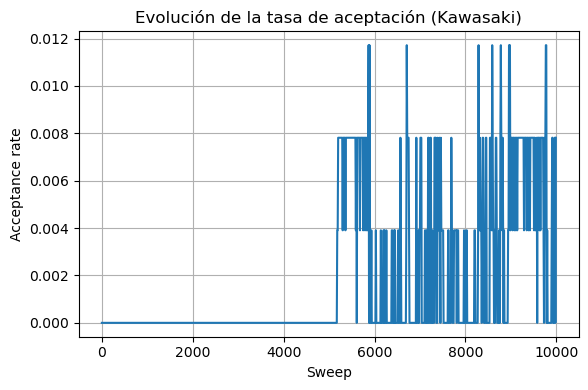

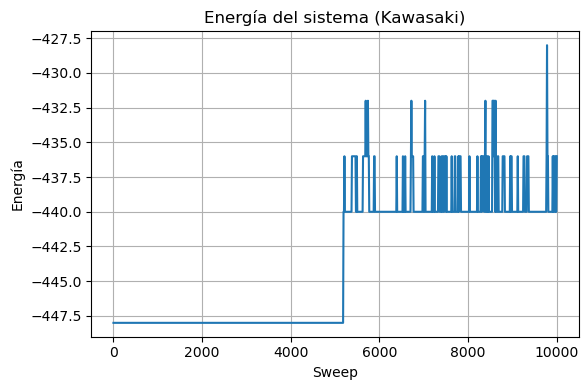

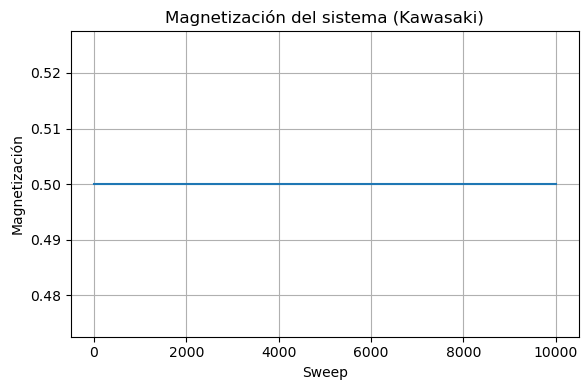

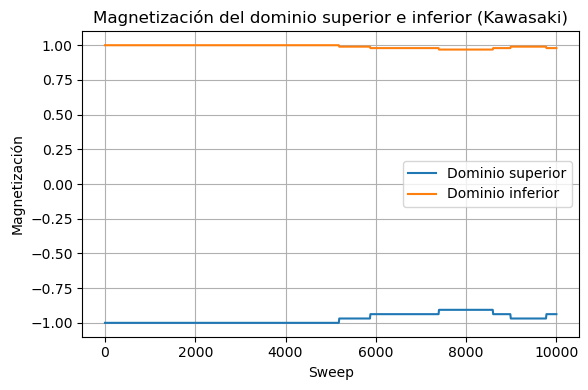

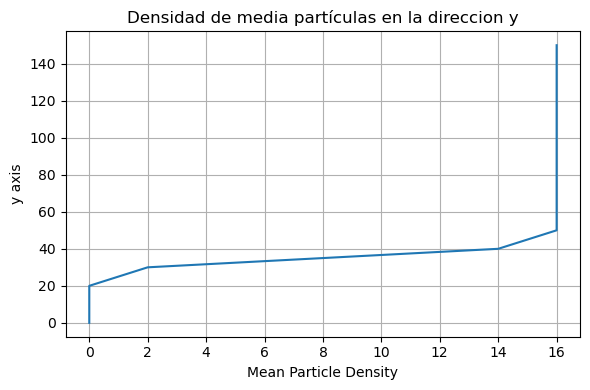

...

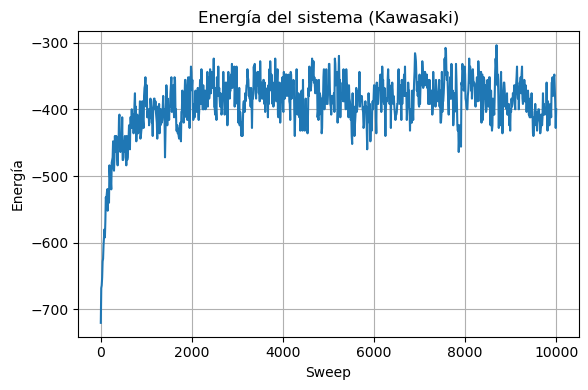

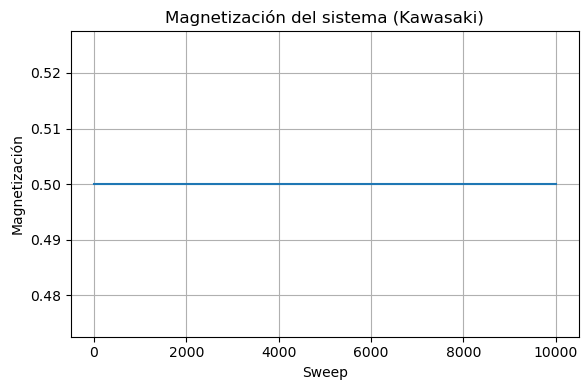

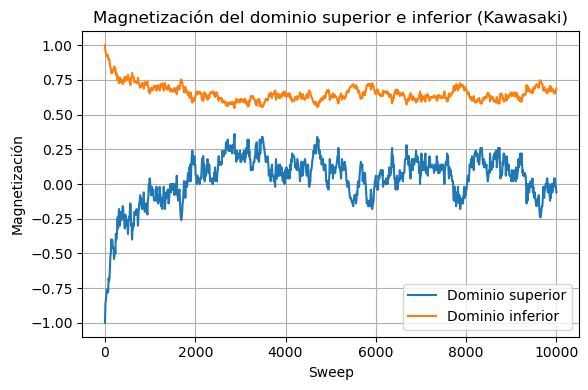

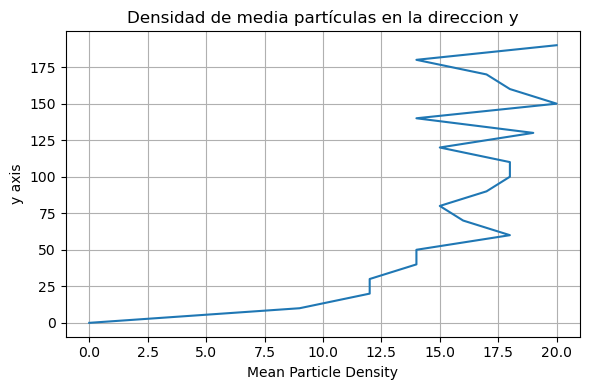

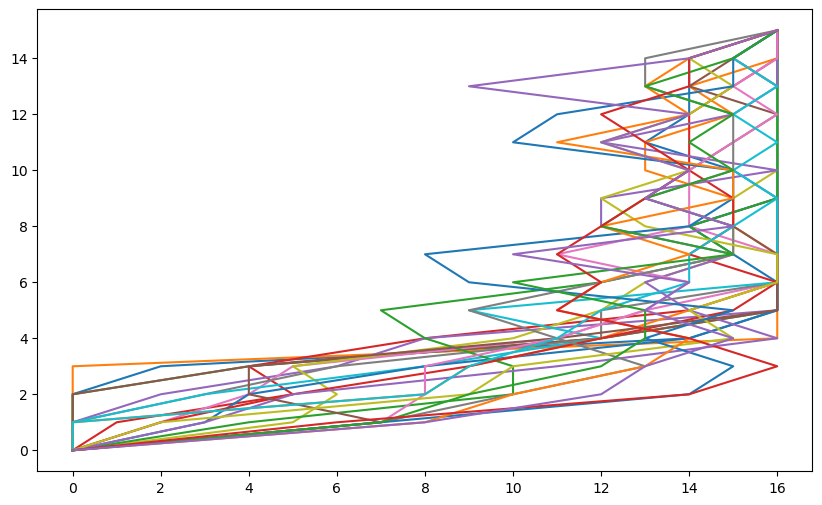

In [10]:
# Celda 10: Ejecución del programa completo

def main():

    # ─── Parámetros base del modelo ────────────────────────────────────────────────────────────────────────────────────

    L                   = 16                        # (int) Tamaño de la red (LxL)
    J                   = 1.0                       # (float) Constante de interacción (J > 0 para ferromagnetismo)
    T                   = 1.0                       # (float) Temperatura del modelo de Ising 2D
    n_sweeps            = 10000                     # (int) Número de sweeps (barridos) a realizar
    density             = 0.75                      # (float) Densidad de espines +1
    threads_percentage  = 100                       # (int) Porcentaje de hilos a usar (100% = todos los disponibles)
    thin                = 10                        # (int) Frecuencia de guardado de configuraciones (1 = cada sweep, 2 = cada 2 sweeps, etc.)     
    Boundary_conditions = True                      # (bool) Condiciones de frontera (True = eje "y" limitado, False = periódicas)
    max_window          = 1000                      # (int) Ventana de datos para la tasa de aceptación (número de sweeps a considerar para calcular la pendiente de la tasa de aceptación)
    threshold           = 10**-8                    # (float) Umbral de pendiente para aceptar la tasa de aceptación (si la pendiente es menor que este valor, se acepta)
    Asimmetric          = True                      # (bool) Densidad de espines asimetricamente distribuidos
    
    # ─── Parámetros de usuario para la generación del vídeo ────────────────────────────────────────────────────────────

    HDF5_FILE = "configs.h5"                    # Nombre del archivo HDF5 con las configuraciones
    DATASET   = "configs"                       # Nombre del dataset dentro del archivo HDF5
    FILE_OUT  = "simulacion"                    # Nombre del archivo de salida (sin extensión ni ruta)
    GPU_ID    = 0                               # 0 = tu NVIDIA 4050
    INTERVAL  = 50                              # ms entre frames → fps = 1000/INTERVAL
    TARGET_size  = 1440                         # Tamaño del vídeo de salida (1440p, 1080p, etc.)
    MIN_SIDE  = 160                             # mínimo seguro para NVENC (≥ 145 y par)

    if not os.path.exists("results"):
        os.makedirs("results")
    destino_base = os.path.join("results", f"Simulacion_Multiple")
    destino = destino_base
    counter = 1
    while os.path.exists(destino):
        destino = f"{destino_base}_({counter})" 
        counter += 1
    os.makedirs(destino)

    # Inicialización de temperaturas
    T_init = 1.00
    T_step = 0.10
    T_max  = 3.50

    # Inicialización de tamaños de red
    L_init = 16
    L_step = 4
    L_max  = 20

    n_temps = int(np.rint((T_max - T_init) / T_step)) + 1
    n_Ls = int(np.rint((L_max - L_init) / L_step)) + 1

    # Arrays para almacenar resultados
    mean_energies_per_particle = np.zeros((n_temps, n_Ls))
    SH = np.zeros((n_temps, n_Ls))
    MS = np.zeros((n_temps, n_Ls))
    magnetization_vs_temp = np.zeros((n_temps, n_Ls, 2))
    dict_densities = {}
    L = L_init
    j = 0

    start_time = time.time()
    for j in range(n_Ls):

        L = L_init + j * L_step
        density_y = np.zeros((n_temps, L))
        for i in range(n_temps):

            T = T_init + i * T_step
            observables = run_whole_simulation(L, J, T, n_sweeps, threads_percentage, thin, Boundary_conditions, density, destino, max_window, threshold, Asimmetric, HDF5_FILE, DATASET, FILE_OUT, GPU_ID, INTERVAL, TARGET_size, MIN_SIDE)
            density_y[i, :] = observables['density']
            mean_energies_per_particle[i, j] = observables['mean_energy_per_particle']
            SH[i, j] = specific_heat(observables['energy'], T, L)
            MS[i, j] = magnetic_susceptibility(observables['domain_magnetization'], T, L)
            magnetization_vs_temp[i, j, :] = observables['domain_magnetization'][:, -1]

        dict_densities[f'Density_L{L}'] = density_y
    end_time = time.time()

    if not os.path.exists(os.path.join(destino, "Observables")):
        Carpeta_Observables = os.path.join(destino, "Observables")
        os.makedirs(Carpeta_Observables)
    
    plot_density_y(dict_densities, T_init, T_step, L_init, L_step, Carpeta_Observables)
    plot_mean_energy_per_particle(mean_energies_per_particle, T_init, T_step, L_init, L_step, Carpeta_Observables)
    plot_specific_heat(SH, T_init, T_step, L_init, L_step, Carpeta_Observables)
    plot_susceptibility(MS, T_init, T_step, L_init, L_step, Carpeta_Observables)
    plot_magnetizations_vs_temp(magnetization_vs_temp, T_init, T_step, L_init, L_step, Carpeta_Observables)

    # Temperatura crítica basada en calor específico
    T_crit_L_SH = np.zeros(n_Ls)
    for j in range(n_Ls):
        T_crit_L_SH[j] = T_init + np.argmax(SH[:, j]) * T_step
    filenameSH = "Tcrit_L_SH.png"
    plot_Tcrit_L(T_crit_L_SH, L_init, L_step, Carpeta_Observables, filenameSH)

    # Temperatura crítica basada en susceptibilidad
    T_crit_L_MS = np.zeros(n_Ls)
    for j in range(n_Ls):
        T_crit_L_MS[j] = T_init + np.argmax(MS[:, j]) * T_step
    filenameMS = 'Tcrit_L_MS.png'
    plot_Tcrit_L(T_crit_L_MS, L_init, L_step, Carpeta_Observables, filenameMS)
    
    print(f"Simulación completada en {end_time - start_time:.2f} s")

main()